In [1]:
import folium
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import numpy as np
from math import pi
from sklearn import linear_model
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.neural_network import MLPClassifier
from sklearn.feature_selection import RFE
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
import seaborn as sns;
import matplotlib.pylab as plt
%matplotlib inline

In [113]:
location = pd.read_csv('files/location.csv')
road_casualities = pd.read_csv('files/roadcasualties.csv')
driver_demographics = pd.read_csv('files/driverdemographics.csv')
restraints = pd.read_csv('files/restrainthelmetuse.csv')
vehicles = pd.read_csv('files/vehicleinvolvement.csv')
factors = pd.read_csv('files/factorsinroadcrashes.csv')
population = pd.read_csv('files/Queensland_population.csv')
vehicle_reg = pd.read_csv('files/Queensland_vehicle_registration.csv')

/Users/killx0n3/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (14) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# Analysing Crash Data in QLD

## Project
Everything around us can be represented and understood through numbers and everything has pattern, even road accidents. 
In this project, we are working with Queensland’s Road Crash data from 2001-2017. The main goal of this project is analysing the data, finding patterns and trying to predict if certain factors are responsible for crashes.

#### Main Goal
Unlike other projects, this project focuses more on visualising, analysing data and finding patterns than predicting.

#### Sub Goal
Using Machine Learning to predict responsible factors for crashes.

## Dataset
This dataset contains information on crashes reported to the police which resulted from the movement of at least 1 road vehicle on a road or road related area.


Source: https://search.data.gov.au/dataset/ds-qld-f3e0ca94-2d7b-44ee-abef-d6b06e9b0729/details?q=characteristic

All datasets have 17 years of data from 2001 to 2017 except the location dataset. location dataset had too much data (over 400k rows) which exceeds GitHub's single file's size restriction. So location data had to be truncated with command prompt and now it has 10 years of data from 2008 to 2017.

## Dataset Details

| Dataframe           	| Year Range  	| Source                                 	|
|---------------------	|-------------	|----------------------------------------	|
| location            	| 2008 - 2017 	| Open Data Australia                    	|
| road_casualities    	| 2001 - 2017 	| Open Data Australia                    	|
| driver_demographics 	| 2001 - 2017 	| Open Data Australia                    	|
| restraints          	| 2001 - 2017 	| Open Data Australia                    	|
| vehicles            	| 2001 - 2017 	| Open Data Australia                    	|
| factors             	| 2001 - 2017 	| Open Data Australia                    	|
| population          	| 2001 - 2017 	| Population Australia                   	|
| vehicle_reg         	| 2001 - 2017 	| Department of Transport and Main Roads 	|

## Let's have a look at Dataframes
We will print heads of all dataframes which will show first 5 rows of each dataframes.

In [3]:
location.head()

,Crash_Ref_Number,Crash_Severity,Crash_Year,Crash_Month,Crash_Day_Of_Week,Crash_Hour,Crash_Nature,Crash_Type,Crash_Longitude_GDA94,Crash_Latitude_GDA94,...,Count_Casualty_MedicallyTreated,Count_Casualty_MinorInjury,Count_Casualty_Total,Count_Unit_Car,Count_Unit_Motorcycle_Moped,Count_Unit_Truck,Count_Unit_Bus,Count_Unit_Bicycle,Count_Unit_Pedestrian,Count_Unit_Other
0,158557,Hospitalisation,2008,January,Tuesday,14,Angle,Multi-Vehicle,153.022788,-27.470214,...,0,0,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1,158558,Medical treatment,2008,January,Tuesday,2,Rear-end,Multi-Vehicle,153.005221,-27.473120,...,1,0,1,2.0,0.0,0.0,2.0,0.0,0.0,0.0
2,158559,Medical treatment,2008,January,Tuesday,14,Angle,Multi-Vehicle,153.018472,-27.468164,...,1,0,1,2.0,0.0,0.0,0.0,0.0,0.0,0.0
3,158560,Property damage only,2008,January,Tuesday,22,Hit object,Single Vehicle,153.030674,-27.447999,...,0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,158561,Property damage only,2008,January,Tuesday,1,Hit parked vehicle,Single Vehicle,153.063592,-27.486345,...,0,0,0,3.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
road_casualities.head()

,Crash_Year,Crash_Police_Region,Casualty_Severity,Casualty_AgeGroup,Casualty_Gender,Casualty_RoadUserType,Casualty_Count
0,2006,South Eastern,Medically treated,Unknown,Unknown,Passenger,26
1,2004,Central,Hospitalised,Unknown,Unknown,Passenger,1
2,2003,Brisbane,Minor injury,Unknown,Unknown,Passenger,13
3,2006,Brisbane,Minor injury,Unknown,Unknown,Motorcyclist,1
4,2007,Brisbane,Hospitalised,Unknown,Unknown,Passenger,3


In [5]:
driver_demographics.head()

,Crash_Year,Crash_Police_Region,Crash_Severity,Involving_Male_Driver,Involving_Female_Driver,Involving_Young_Driver_16-24,Involving_Senior_Driver_60plus,Involving_Provisional_Driver,Involving_Overseas_Licensed_Driver,Involving_Unlicensed_Driver,Count_Crashes,Count_Casualty_Fatality,Count_Casualty_Hospitalised,Count_Casualty_MedicallyTreated,Count_Casualty_MinorInjury,Count_Casualty_All
0,2001,Brisbane,Fatal,No,No,No,No,No,No,No,1,1,0,0,0,1
1,2001,Brisbane,Fatal,No,Yes,No,No,No,No,No,5,5,1,0,0,6
2,2001,Brisbane,Fatal,No,Yes,No,Yes,No,No,No,4,4,0,2,0,6
3,2001,Brisbane,Fatal,No,Yes,No,Yes,No,No,Yes,1,1,0,0,0,1
4,2001,Brisbane,Fatal,No,Yes,No,Yes,Yes,No,No,1,1,1,0,0,2


In [6]:
restraints.head()

,Crash_Year,Crash_PoliceRegion,Casualty_Severity,Casualty_AgeGroup,Casualty_Gender,Casualty_Road_User_Type,Casualty_Restraint_Helmet_Use,Casualty_Count
0,2001,Brisbane,Fatality,0 to 16,Female,Vehicle Occupant,Restrained,1
1,2001,Brisbane,Fatality,17 to 24,Female,Vehicle Occupant,Restrained,1
2,2001,Brisbane,Fatality,25 to 29,Female,Vehicle Occupant,Restraint Use Not determined,1
3,2001,Brisbane,Fatality,30 to 39,Female,Vehicle Occupant,Restraint Use Not determined,1
4,2001,Brisbane,Fatality,30 to 39,Female,Vehicle Occupant,Unrestrained,1


In [7]:
vehicles.head()

,Crash_Year,Crash_Police_Region,Crash_Severity,Involving_Motorcycle_Moped,Involving_Truck,Involving_Bus,Count_Crashes,Count_Casualty_Fatality,Count_Casualty_Hospitalised,Count_Casualty_MedicallyTreated,Count_Casualty_MinorInjury,Count_Casualty_All
0,2001,Brisbane,Fatal,No,No,No,41,43,20,3,0,66
1,2001,Brisbane,Fatal,No,No,Yes,1,1,1,0,0,2
2,2001,Brisbane,Fatal,No,Yes,No,2,2,0,1,2,5
3,2001,Brisbane,Fatal,Yes,No,No,5,5,0,2,0,7
4,2001,Brisbane,Fatal,Yes,Yes,No,1,1,0,0,0,1


In [114]:
factors.head()

,Crash_Year,Crash_Police_Region,Crash_Severity,Involving_Drink_Driving,Involving_Driver_Speed,Involving_Fatigued_Driver,Involving_Defective_Vehicle,Count_Crashes,Count_Fatality,Count_Hospitalised,Count_Medically_Treated,Count_Minor_Injury,Count_All_Casualties
0,2001,Brisbane,Fatal,No,No,No,No,31,31,8,6,2,47
1,2001,Brisbane,Fatal,No,No,No,Yes,1,1,0,0,0,1
2,2001,Brisbane,Fatal,No,Yes,No,No,8,8,5,0,0,13
3,2001,Brisbane,Fatal,Yes,No,No,No,2,2,0,0,0,2
4,2001,Brisbane,Fatal,Yes,No,No,Yes,1,1,3,0,0,4


In [9]:
population.head()

,Year,Population,Unnamed: 2
0,2001,3670459,NaN
1,2002,3750500,NaN
2,2003,3840100,NaN
3,2004,3919500,NaN
4,2005,4001000,NaN


In [10]:
vehicle_reg.head()

,Year,Vehicle_reg
0,2001,2963921
1,2002,3067566
2,2003,3195635
3,2004,3356887
4,2005,3527182


## Helping Functions
These functions are used throughout the entire project in variaous situations.

In [112]:
#Converts given dataframe's categorical labels into numbers using OrdinalEncoder()
def ordinal_encoder(_data):
    data = _data.copy()
    enc = OrdinalEncoder()
    for x in data.columns:
        data[x] = enc.fit_transform(data[[x]])
    return data

#Returns crash year with casualty count from the given dataframe in a dictionary
def year_count(data):
    yearWithCount = {}
    for i in range(0, data.shape[0]):
        yearWithCount[data.iloc[i]['Crash_Year']] = 0
    for i in range(0, data.shape[0]):
        yearWithCount[data.iloc[i]['Crash_Year']] = yearWithCount[data.iloc[i]['Crash_Year']] + data.iloc[i]['Casualty_Count']
    return yearWithCount

#Returns month with casualty count from the given dataframe in a dictionary
def month_count(data):
    monthWithCount = {}
    for i in range(0, data.shape[0]):
        monthWithCount[data.iloc[i]['Crash_Month']] = 0
    for i in range(0, data.shape[0]):
        monthWithCount[data.iloc[i]['Crash_Month']] = monthWithCount[data.iloc[i]['Crash_Month']] + data.iloc[i]['Count_Casualty_Total']
    return monthWithCount

#Returns day with casualty count from the given dataframe in a dictionary
def day_count(data):
    dayWithCount = {}
    for i in range(0, data.shape[0]):
        dayWithCount[data.iloc[i]['Crash_Day_Of_Week']] = 0
    for i in range(0, data.shape[0]):
        dayWithCount[data.iloc[i]['Crash_Day_Of_Week']] = dayWithCount[data.iloc[i]['Crash_Day_Of_Week']] + data.iloc[i]['Count_Casualty_Total']
    return dayWithCount

#Returns road user type with casualty count from the given dataframe in a dictionary
def cas_type(data):
    cas_typeWithCount = {}
    for i in range(0, data.shape[0]):
        cas_typeWithCount[data.iloc[i]['Casualty_Road_User_Type']] = 0
    for i in range(0, data.shape[0]):
        cas_typeWithCount[data.iloc[i]['Casualty_Road_User_Type']] = cas_typeWithCount[data.iloc[i]['Casualty_Road_User_Type']] + data.iloc[i]['Casualty_Count']
    return cas_typeWithCount

#Returns a dictionary of dictionaries which have casualty count for each day and hour from the given dataframe
def heatGen(data):
    dic = dict()
    days_lst = ['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
    time_lst = [x for x in range(0,24)]
    for i in range(0, len(time_lst)):
        for x in days_lst:
            dic[i]={}
            
    for i in range(0, len(time_lst)):
        for x in days_lst:
            dic[i][x]=0
            
    for i in range(0, data.shape[0]):
        dic[data.iloc[i]['Crash_Hour']][data.iloc[i]['Crash_Day_Of_Week']] += 1
    return dic


## Let's analyse past year's data (2017)

In [12]:
#Getting 2017's data from the whole dataframe
location_2017 = location[location.Crash_Year==2017].copy()

In [13]:
#Initialising the map with default coordinates
map_loc = folium.Map(
    location=[-27.470214, 153.022788],
    tiles='Stamen Toner',
    zoom_start=12
)
#Looping through the dataframe
for i in range(0, location_2017.shape[0]):
    #If its a fatal crash then mark it death
    if (location_2017.iloc[i].Crash_Severity == 'Fatal'):
        folium.Circle(
        radius=2,
        location=[location_2017.iloc[i].Crash_Latitude_GDA94, location_2017.iloc[i].Crash_Longitude_GDA94],
        popup='Death',
        color='crimson',
        fill=False,
        ).add_to(map_loc)
    #If its not a fatal crash then mark it injured
    else:
        folium.Circle(
        radius=2,
        location=[location_2017.iloc[i].Crash_Latitude_GDA94, location_2017.iloc[i].Crash_Longitude_GDA94],
        popup='Injured',
        color='gold',
        fill=False,
        ).add_to(map_loc)

## QLD Map with Crash Locations
Zoom in or out for more details

**Note: The map does not show up on GitHub output view. it's because, the map is running through a JavaScript map backend and GitHub output view blocks JavaScript. Please use the HTML file to view the notebook or use the jupyter notebook file.**

In [14]:
map_loc

<font color='#FFD70B'>⬤</font> : Injured
<br/>
<font color='red'>⬤</font> : Death

In [15]:
#Resetting index
location_2017=location_2017.reset_index(drop=True)

In [16]:
location_2017.head()

,Crash_Ref_Number,Crash_Severity,Crash_Year,Crash_Month,Crash_Day_Of_Week,Crash_Hour,Crash_Nature,Crash_Type,Crash_Longitude_GDA94,Crash_Latitude_GDA94,...,Count_Casualty_MedicallyTreated,Count_Casualty_MinorInjury,Count_Casualty_Total,Count_Unit_Car,Count_Unit_Motorcycle_Moped,Count_Unit_Truck,Count_Unit_Bus,Count_Unit_Bicycle,Count_Unit_Pedestrian,Count_Unit_Other
0,303035,Hospitalisation,2017,January,Sunday,23,Hit object,Single Vehicle,152.969728,-27.622789,...,0,0,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,303036,Hospitalisation,2017,January,Sunday,5,Hit object,Single Vehicle,153.066062,-27.447047,...,0,0,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,303037,Hospitalisation,2017,January,Sunday,21,Hit object,Single Vehicle,153.089948,-27.568735,...,0,0,1,2.0,0.0,0.0,0.0,0.0,0.0,0.0
3,303038,Hospitalisation,2017,January,Sunday,9,Angle,Multi-Vehicle,153.035887,-27.484564,...,0,0,1,2.0,0.0,0.0,0.0,0.0,0.0,0.0
4,303039,Medical treatment,2017,January,Sunday,7,Rear-end,Multi-Vehicle,153.032945,-27.489759,...,3,0,3,2.0,0.0,0.0,0.0,0.0,0.0,0.0


## Do accidents in high-speed-limit areas have more death?

In [17]:
#Dictionaries for storing crash and death data
speed_crash = {}
#Initialising dictionaries with 0 value
speed_crash['Under 80 km/h'] = 0
speed_crash['Over 80 km/h'] = 0
speed_death = {}
speed_death['Under 80 km/h'] = 0
speed_death['Over 80 km/h'] = 0

for i in range(0, location_2017.shape[0]):
    #If Crash_Speed_Limit is not 80 - 90 km/h or 100 - 110 km/h then add +1
    if ((location_2017.iloc[i]['Crash_Speed_Limit']!= '80 - 90 km/h') & 
            (location_2017.iloc[i]['Crash_Speed_Limit']!= '100 - 110 km/h')):
        speed_crash['Under 80 km/h'] += 1
    #If Crash_Speed_Limit is 80 - 90 km/h or 100 - 110 km/h then add +1
    else:
        speed_crash['Over 80 km/h'] += 1
        
    #If Crash_Severity is is Fatal means caused death        
    if (location_2017.iloc[i]['Crash_Severity']=='Fatal'):
        #If Crash_Speed_Limit is not 80 - 90 km/h or 100 - 110 km/h then add +1
        if ((location_2017.iloc[i]['Crash_Speed_Limit']!= '80 - 90 km/h') & 
            (location_2017.iloc[i]['Crash_Speed_Limit']!= '100 - 110 km/h')):
            speed_death['Under 80 km/h'] += location_2017.iloc[i]['Count_Casualty_Fatality']
        #If Crash_Speed_Limit is 80 - 90 km/h or 100 - 110 km/h then add +1
        else:
            speed_death['Over 80 km/h'] += location_2017.iloc[i]['Count_Casualty_Fatality']

### Result

In [18]:
print('Out of '+str(speed_crash['Under 80 km/h'])+' car crashes on roads with speed limit under 80 km/h, '+
      str(speed_death['Under 80 km/h'])+' people died. Death rate: '
      +str(round(speed_death['Under 80 km/h']/speed_crash['Under 80 km/h']*100, 2))+'%')

print('Out of '+str(speed_crash['Over 80 km/h'])+' car crashes on roads with speed limit over 80 km/h (Highways), '+
      str(speed_death['Over 80 km/h'])+' people died. Death rate: '
      +str(round(speed_death['Over 80 km/h']/speed_crash['Over 80 km/h']*100, 2))+'%')

Out of 9230 car crashes on roads with speed limit under 80 km/h, 104 people died. Death rate: 1.13%
Out of 3133 car crashes on roads with speed limit over 80 km/h (Highways), 143 people died. Death rate: 4.56%


### Visualisation

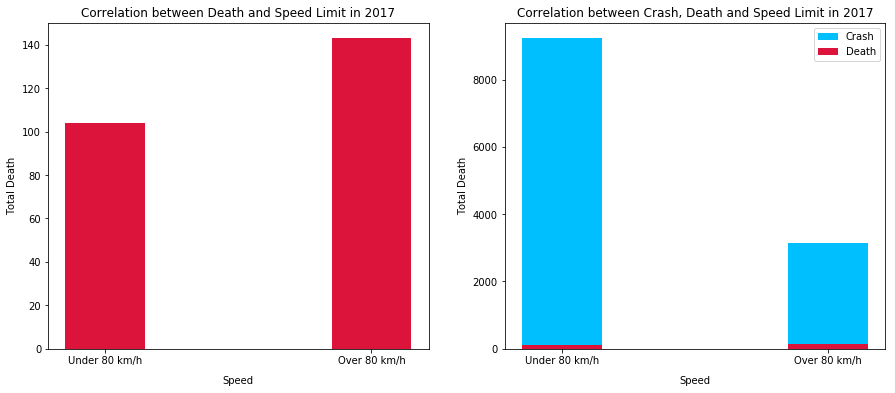

In [19]:
#Multi plot
fig, axs = plt.subplots(1,2, figsize=(15, 6), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .5, wspace=.2)
axs = axs.ravel()

#Plot 1 for death only
axs[0].bar(speed_death.keys(), speed_death.values(), width=0.3, align='center', color = 'crimson')
axs[0].set_xlabel('Speed', labelpad=10)
axs[0].set_ylabel('Total Death', labelpad=5)
axs[0].set_title("Correlation between Death and Speed Limit in 2017")

#Plot 2 for crash and death
axs[1].bar(speed_crash.keys(), speed_crash.values(), width=0.3, align='center', color='deepskyblue', label='Crash')
axs[1].bar(speed_death.keys(), speed_death.values(), width=0.3, align='center', color='crimson', label='Death')
axs[1].set_xlabel('Speed', labelpad=10)
axs[1].set_ylabel('Total Death', labelpad=5)
axs[1].set_title("Correlation between Crash, Death and Speed Limit in 2017")
plt.legend()
plt.show()

## Road Casualty in past 10 years (2008-2017)

In [20]:
#Using month_count function to get month with casualty count dictionary
cas_data_by_month = month_count(location)

In [21]:
#Putting the dictionary into a dataframe
cas_data_by_month_df = pd.DataFrame({'month': [x for x in cas_data_by_month.keys()], 
                              'total_casualty': [x for x in cas_data_by_month.values()]})

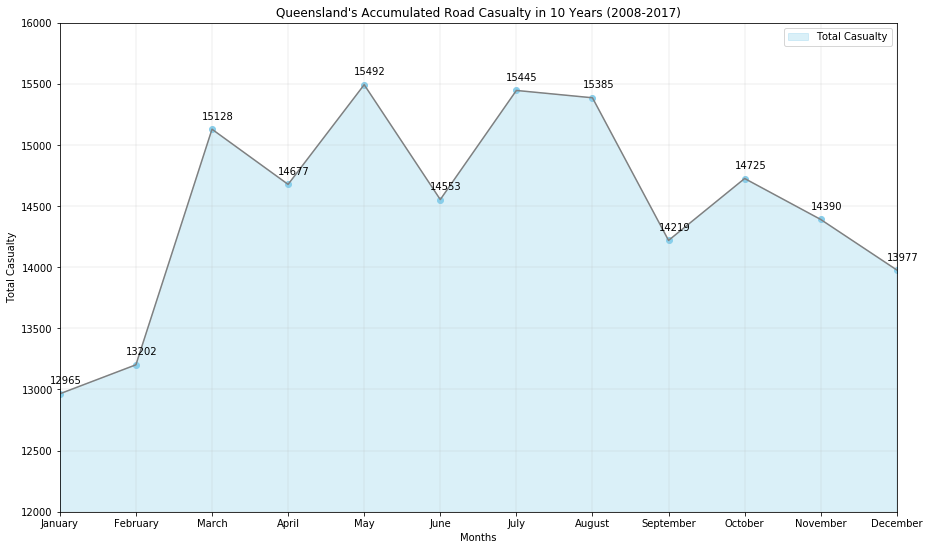

In [22]:
# Make plot
plt.figure(figsize=(15,9))
plt.grid(linestyle='-', linewidth=0.2)
plt.fill_between(cas_data_by_month_df.month, cas_data_by_month_df.total_casualty, color="skyblue", alpha=0.3, 
                 label='Total Casualty')
plt.plot(cas_data_by_month_df.month, cas_data_by_month_df.total_casualty, color="gray", label='_nolegend_')
plt.scatter(cas_data_by_month_df.month, cas_data_by_month_df.total_casualty, color="skyblue", 
            label='_nolegend_')
for i,j in zip(cas_data_by_month_df.month, cas_data_by_month_df.total_casualty):
    plt.annotate(str(j),xy=(i,j), xytext=(-10,10), textcoords='offset points')
plt.axis([0, 11, 12000, 16000])
# Plot texts
plt.title("Queensland's Accumulated Road Casualty in 10 Years (2008-2017)")
plt.xlabel("Months")
plt.ylabel("Total Casualty")
plt.legend()
plt.show()

**Analysis:** We can see from here in last 10 years January has the lowest amount of accidents and May has the highest amount of accidents. The lowest amount of accident might be causing because of the holiday period.

## Road Casualty in past 10 years (2008-2017) by years

In [23]:
#Making a list of dictionaries of casualty data from 2008 - 2017
list_months_by_years = []
#Looping from 2008 to 2017 (2018 is excluded in the loop)
for y in range(2008, 2018):
    list_months_by_years.append(month_count(location[location.Crash_Year==y]))

In [24]:
#Making a list of dataframes of casualty data from 2008 - 2017
list_months_by_years_dfs = []
for y in list_months_by_years:
    list_months_by_years_dfs.append(pd.DataFrame({'month': [x for x in y.keys()], 
                              'total_casualty': [x for x in y.values()]}))

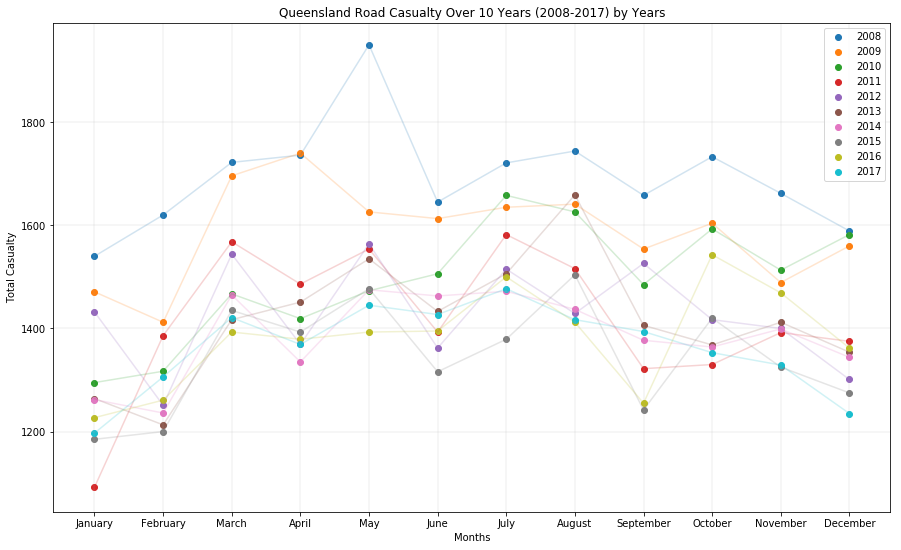

In [25]:
# Make plot
plt.figure(figsize=(15,9))
plt.grid(linestyle='-', linewidth=0.2)
years = [x for x in range(2008, 2018)]
temp_i = 0
for x in list_months_by_years_dfs:
    plt.scatter(x.month, x.total_casualty, 
         label=years[temp_i])
    plt.plot(x.month, x.total_casualty, alpha=0.2, 
         label='_nolegend_')
    temp_i+=1
# Plot texts
plt.legend()
plt.ylabel('Total Casualty')
plt.xlabel('Months')
plt.title('Queensland Road Casualty Over 10 Years (2008-2017) by Years')
plt.show()

**Analysis:** From here we can see almost every year (excepts a few like 2008, 2009 or 2011) follows the same pattern.

## Why do we see more cops on the roads on Fridays?

In [26]:
#Using day_count function to get day with casualty count dictionary
cas_data_by_days = day_count(location)

In [27]:
#Putting the dictionary into a dataframe
cas_data_by_days_df = pd.DataFrame({'day': [x for x in cas_data_by_days.keys()], 
                              'total_casualty': [x for x in cas_data_by_days.values()]})

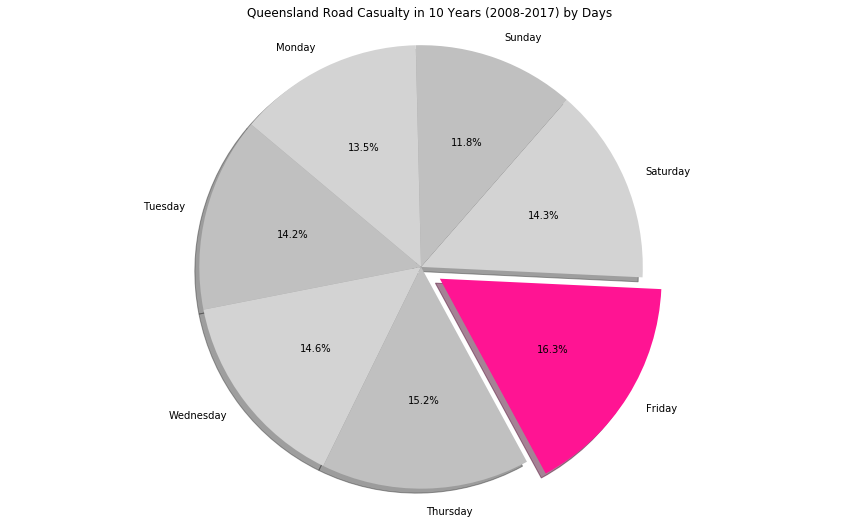

In [28]:
#Make plot
plt.figure(figsize=(15,9))
colors = ['silver', 'lightgray', 'silver', 'deeppink', 'lightgray', 'silver', 'lightgray']
plt.pie(cas_data_by_days_df.total_casualty, explode=(0, 0, 0, 0.1, 0, 0, 0), 
        labels = cas_data_by_days_df.day, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
#Plot texts
plt.title('Queensland Road Casualty in 10 Years (2008-2017) by Days')
plt.axis('equal')
plt.show()

**Analysis:** Friday has the most accident rate of 16.3%. It could be because people are excited about weekends and speeding to go home.

## When is the most dangerous time to drive?
What time is causing more accidents?

In [29]:
#Using heatGen function to get the time and day with casualty count dictionary of dictionaries
heat_dic = heatGen(location)

In [30]:
#Putting the dictionary into a dataframe according to the days
heat_df = pd.DataFrame({'Saturday': [heat_dic[x]['Saturday'] for x in heat_dic],
                       'Sunday': [heat_dic[x]['Sunday'] for x in heat_dic],
                       'Monday': [heat_dic[x]['Monday'] for x in heat_dic],
                       'Tuesday': [heat_dic[x]['Tuesday'] for x in heat_dic],
                       'Wednesday': [heat_dic[x]['Wednesday'] for x in heat_dic],
                       'Thursday': [heat_dic[x]['Thursday'] for x in heat_dic],
                       'Friday': [heat_dic[x]['Friday'] for x in heat_dic],})

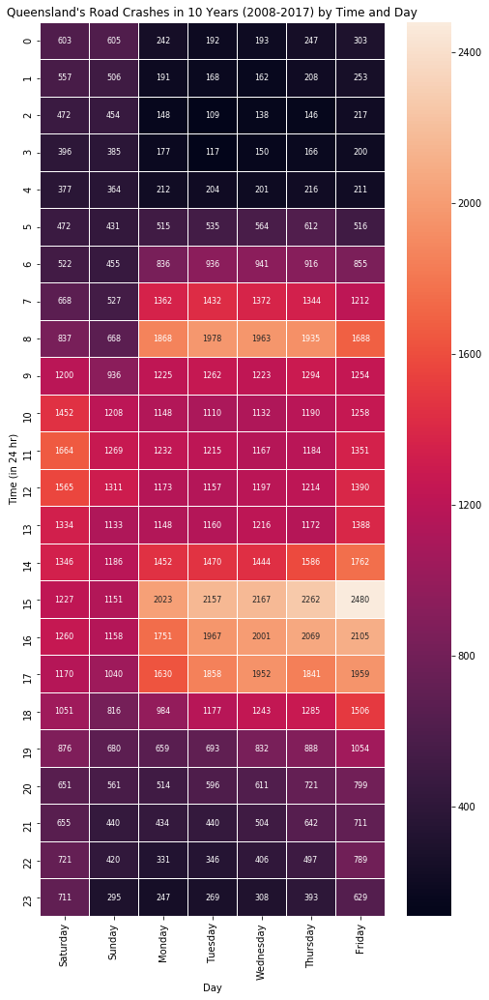

In [31]:
#Make plot
plt.figure(figsize=(8,17))
sns.heatmap(heat_df, annot=True, fmt='g', annot_kws={"size": 8},linewidths=0.01, linecolor='white')
#Plot texts
plt.xlabel("Day")
plt.ylabel("Time (in 24 hr)")
plt.title("Queensland's Road Crashes in 10 Years (2008-2017) by Time and Day")
plt.show()

**Analysis:** From the heatmap we can see Friday afternoon at 15:00 (3:00PM) has the most accident rate. It could be because most people are coming from work and weekend is ahead so peope are more tend to do speedig or break road rules. Also, we can see during week days at 8:00am we have a linear accident rate which is because that's a peak time when people normally go to work. We can also see on Saturday 11-12am there are some crashes, that's because people go out with families during that time. Friday Night and Saturday night at 23:00 (11:00Pm) has a significant number of crashes, it could be because people are drink driving from parties.

# Train a model with Linear Regression to predict the number of casualty

In [32]:
#Using year_count function to get year with casualty count dictionary
rc_data = year_count(road_casualities)

In [33]:
#Putting the dictionary into a dataframe
road_cas_data = pd.DataFrame({'year': [x for x in rc_data.keys()], 'total_casualty': [x for x in rc_data.values()]})

In [34]:
#Sorting by year
road_cas_data.sort_values('year', inplace=True)

In [35]:
#Resetting index
road_cas_data = road_cas_data.reset_index(drop=True)

In [36]:
#Dropping unnecessary column
population.drop(columns='Unnamed: 2', inplace=True)

In [37]:
#Adding population and vehicle registration data to the dataframe
road_cas_data['Population'] = population.Population
road_cas_data['total_vehicle'] = vehicle_reg.Vehicle_reg

### Using sklearn train test split to split the data. 70% of data is used as the training set with the rest as the test set.

In [38]:
#Splitting train, test data
X_train_rc, X_test_rc, y_train_rc, y_test_rc = train_test_split(road_cas_data.drop(columns='total_casualty'), 
                                                                road_cas_data.total_casualty, 
                                                                random_state=0, test_size=0.30)

In [39]:
#Training Linear Regression Model
lr_rc = linear_model.LinearRegression()
lr_rc.fit(X_train_rc, y_train_rc)

predicted = lr_rc.predict(X_train_rc)

### R<sup>2</sup> Score

In [40]:
#R^2 Score
r2 = r2_score(y_train_rc, predicted)
print("R Squared:", r2)

R Squared: 0.8134012806428925


In [41]:
#Putting every year's prediction in a dictionary
def cas(data):
    data = data.drop(columns='total_casualty')
    dct = {}
    for i in range(0, data.shape[0]):
        dct[data.iloc[i]['year']] = lr_rc.predict(data.iloc[[i]])[0]
    return dct

In [42]:
#Getting every year's prediction in a dictionary
xa = cas(road_cas_data)

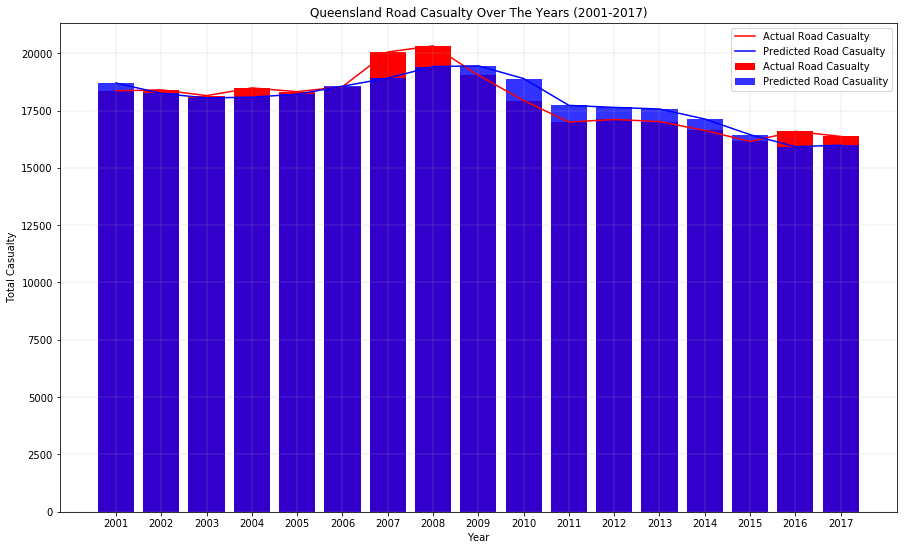

In [43]:
#Make Plot
plt.figure(figsize=(15,9))
plt.grid(linestyle='-', linewidth=0.2)
plt.bar(road_cas_data.year, road_cas_data.total_casualty, color="red", label='Actual Road Casualty')
plt.bar(xa.keys(), xa.values(), alpha=0.8, color="blue", label='Predicted Road Casuality')
plt.plot(road_cas_data.year, road_cas_data.total_casualty, color="red", label='Actual Road Casualty')
plt.plot(xa.keys(), xa.values(), color="blue", label='Predicted Road Casualty')
plt.xticks(np.arange(min(road_cas_data.year), max(road_cas_data.year)+1, 1.0))
plt.legend()
#Plot Texts
plt.ylabel('Total Casualty')
plt.xlabel('Year')
plt.title('Queensland Road Casualty Over The Years (2001-2017)')
plt.show()

Population data is collected from <b>Population Australia</b> website. Its predicted to have 4,98,0000 population in 2018 Source: http://www.population.net.au/population-of-queensland/.
Vehicle registration data including 2018 is collected from <b> Department of Transport and Main Roads - Queensland Government </b> website. Source: https://www.tmr.qld.gov.au/Safety/Transport-and-road-statistics/Registration-statistics.aspx

In [44]:
#2018's population and vehicle registration data manually inputted from aformentioned source
prd_year = pd.DataFrame({'year': [2018], 'Population': [4980000], 'total_vehicle': [5273749]})
lr_rc.predict(prd_year)[0]
xb = xa.copy()
xb[2018] = lr_rc.predict(prd_year)[0]

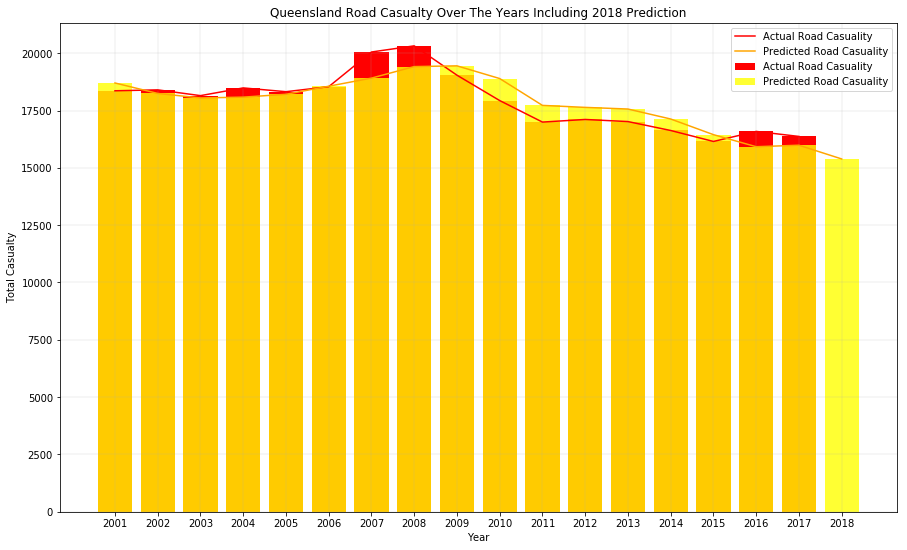

Predicted Number of Casualty in 2018:  15387.81


In [45]:
#Make plot
plt.figure(figsize=(15,9))
plt.grid(linestyle='-', linewidth=0.2)
plt.bar(road_cas_data.year, road_cas_data.total_casualty, color="red", label='Actual Road Casuality')
plt.bar(xb.keys(), xb.values(), alpha=0.8, color="yellow", label='Predicted Road Casuality')
plt.plot(road_cas_data.year, road_cas_data.total_casualty, color="red", label='Actual Road Casuality')
plt.plot(xb.keys(), xb.values(), color="orange", label='Predicted Road Casuality')
plt.xticks(np.arange(min(xb.keys()), max(xb.keys())+1, 1.0))
plt.legend()
#Plot Texts
plt.ylabel('Total Casualty')
plt.xlabel('Year')
plt.title('Queensland Road Casualty Over The Years Including 2018 Prediction')
plt.show()
print('Predicted Number of Casualty in 2018: ',round(xb[2018],2))

**Analysis:** As we can see from the previous trend (2001 to 2017), this model is predicting really close values. So we can say the predicted number of Casualty in 2018 is 15387.81 should be really close to the actual value and ofcourse there will be +- tolerance value.

### How many times more likely are accidents involving male car drivers to be fatal compared to accidents involving female car drivers?

In [46]:
#Function to get gender with death count which returns a dictionary
def gender_count_fatal(data):
    genderWithCount = {}
    genderWithCount['Male'] = 0
    genderWithCount['Female'] = 0
    for i in range(0, data.shape[0]):
        if ((data.iloc[i]['Involving_Male_Driver']=='Yes' and data.iloc[i]['Involving_Female_Driver']=='Yes') and 
            data.iloc[i]['Crash_Severity']=='Fatal'):
            genderWithCount['Male'] += 1
            genderWithCount['Female'] += 1
        elif (data.iloc[i]['Involving_Male_Driver']=='Yes' and data.iloc[i]['Crash_Severity']=='Fatal'):
            genderWithCount['Male'] += 1
        elif (data.iloc[i]['Involving_Female_Driver']=='Yes'and data.iloc[i]['Crash_Severity']=='Fatal'):
            genderWithCount['Female'] += 1
            
    return genderWithCount

In [47]:
#Using gender_count_fatal function to get gender with death count dictionary
gen_data_fatal = gender_count_fatal(driver_demographics)

### Result

In [48]:
#Prints the result
print('Male car drivers are about '+str(round(gen_data_fatal['Male']/gen_data_fatal['Female'],2))+' times more likely to be involved in fatal accidents than female car drivers.')

Male car drivers are about 1.57 times more likely to be involved in fatal accidents than female car drivers.


## Who are the victims?

In [49]:
#Using cas_type function to get victim with casualty count dictionary
cas_type_data = cas_type(restraints)

In [50]:
#Putting the dictionary into a dataframe
cas_type_data_df = pd.DataFrame({'Type': [x for x in cas_type_data.keys()], 
                              'total_casualty': [x for x in cas_type_data.values()]})
#Replacing word for better visualisation
cas_type_data_df = cas_type_data_df.replace('Vehicle Occupant', 'Regular Vehicle Occupant')

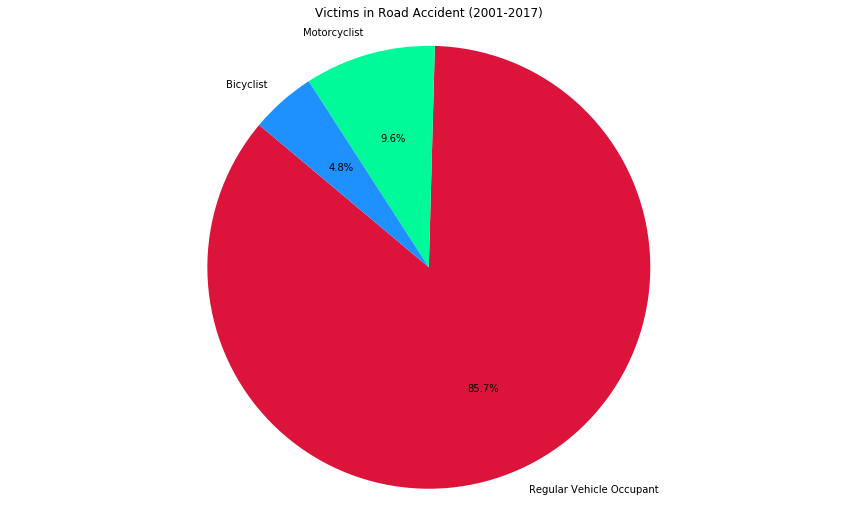

In [51]:
# Make plot
plt.figure(figsize=(15,9))
colors = ['crimson', 'mediumspringgreen', 'dodgerblue']
plt.pie(cas_type_data_df.total_casualty, explode=(0, 0, 0), 
        labels = cas_type_data_df.Type, colors=colors,
        autopct='%1.1f%%', shadow=False, startangle=140)
#Plot texts
plt.title('Victims in Road Accident (2001-2017)')
plt.axis('equal')
plt.show()

**Analysis:** From here we can see 85.7% of time it's a regular vehicle occupant who is a victim of the crash. Also, 9.6% of time its motorcylists and 4.8 of times its bicyclist. Though this data is clearly obvious because there are more regular vehicle (Car, Bus, Truck) than motorcycle or bicycle.

# Predict Involvement of Drink Driving in Crashes

#### Using `factors` dataset. First convert categorical data in numbers with Ordinal Encoder.

In [115]:
#Calling the ordinal_encoder function, to encode categorical data into numbers
drink_driving = ordinal_encoder(factors)

In [117]:
drink_driving.head()

,Crash_Year,Crash_Police_Region,Crash_Severity,Involving_Drink_Driving,Involving_Driver_Speed,Involving_Fatigued_Driver,Involving_Defective_Vehicle,Count_Crashes,Count_Fatality,Count_Hospitalised,Count_Medically_Treated,Count_Minor_Injury,Count_All_Casualties
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0,30.0,8.0,6.0,2.0,47.0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,7.0,8.0,5.0,0.0,0.0,13.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,2.0
4,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,3.0,0.0,0.0,4.0


#### Using sklearn train test split to split the data. 70% of data is used as the training set with the rest as the test set.

In [118]:
X_train_dd, X_test_dd, y_train_dd, y_test_dd = train_test_split(drink_driving.drop(columns='Involving_Drink_Driving'), 
                                                                drink_driving.Involving_Drink_Driving, 
                                                                random_state=0, test_size=0.30)

## Training an MLPClassifier

#### With `random_state=0` and `max_iter=400`

In [119]:
mlp_dd = MLPClassifier(random_state=0, max_iter=400).fit(X_train_dd, y_train_dd)

## Drink Driving in Crashes Accuracy

Drink Driving in Crashes Accuracy:

Train Set Score: 93.13%
Test Set Score: 88.3%


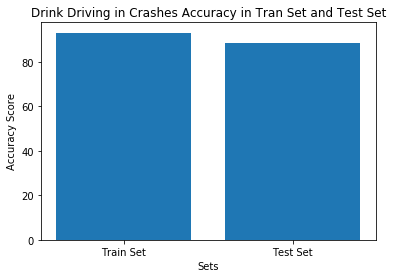

In [120]:
print('Drink Driving in Crashes Accuracy:\n')
print('Train Set Score: '+str(round(mlp_dd.score(X_train_dd, y_train_dd)*100, 2))+'%')
print('Test Set Score: '+str(round(mlp_dd.score(X_test_dd, y_test_dd)*100, 2))+'%')

#Make Plot
plt.bar(['Train Set', 'Test Set'], [round(mlp_dd.score(X_train_dd, y_train_dd)*100, 2), 
                                    round(mlp_dd.score(X_test_dd, y_test_dd)*100, 2)])
#Plot texts
plt.title('Drink Driving in Crashes Accuracy in Tran Set and Test Set')
plt.xlabel('Sets')
plt.ylabel('Accuracy Score')
plt.show()

# Predict Involvement of Speeding in Crashes

#### Using `factors` dataset. First convert categorical data in numbers with Ordinal Encoder.

In [121]:
#Calling the ordinal_encoder function, to encode categorical data into numbers
speeding = ordinal_encoder(factors)

In [122]:
speeding.head()

,Crash_Year,Crash_Police_Region,Crash_Severity,Involving_Drink_Driving,Involving_Driver_Speed,Involving_Fatigued_Driver,Involving_Defective_Vehicle,Count_Crashes,Count_Fatality,Count_Hospitalised,Count_Medically_Treated,Count_Minor_Injury,Count_All_Casualties
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0,30.0,8.0,6.0,2.0,47.0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,7.0,8.0,5.0,0.0,0.0,13.0
3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,2.0
4,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,3.0,0.0,0.0,4.0


#### Using sklearn train test split to split the data. 70% of data is used as the training set with the rest as the test set.

In [123]:
X_train_sp, X_test_sp, y_train_sp, y_test_sp = train_test_split(speeding.drop(columns='Involving_Driver_Speed'), 
                                                                speeding.Involving_Driver_Speed, 
                                                                random_state=0, test_size=0.30)

## Training an MLPClassifier

#### With `random_state=0` and `max_iter=400`

In [124]:
mlp_sp = MLPClassifier(random_state=0, max_iter=400).fit(X_train_sp, y_train_sp)

## Speeding Involvement in Crashes Accuracy

Speeding Involvement in Crashes Accuracy:

Train Set Score: 94.21%
Test Set Score: 90.2%


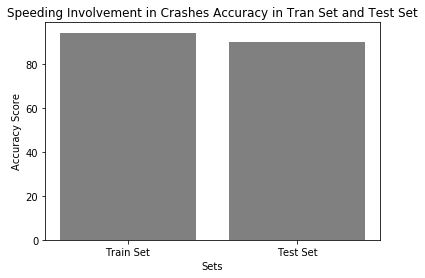

In [125]:
print('Speeding Involvement in Crashes Accuracy:\n')
print('Train Set Score: '+str(round(mlp_sp.score(X_train_sp, y_train_sp)*100, 2))+'%')
print('Test Set Score: '+str(round(mlp_sp.score(X_test_sp, y_test_sp)*100, 2))+'%')

#Make plot
plt.bar(['Train Set', 'Test Set'], [round(mlp_sp.score(X_train_sp, y_train_sp)*100, 2), 
                                    round(mlp_sp.score(X_test_sp, y_test_sp)*100, 2)], color='gray')
#Plot texts
plt.title('Speeding Involvement in Crashes Accuracy in Tran Set and Test Set')
plt.xlabel('Sets')
plt.ylabel('Accuracy Score')
plt.show()

<h3>Examining data in restraints dataset, with a focus on the age group, use of restraints and gender</h3>


In [62]:
def age_count(data):
    ageWithCount = {}
    for i in range(0, data.shape[0]):
        ageWithCount[data.iloc[i]['Casualty_AgeGroup']] = 0
    for i in range(0, data.shape[0]):
        ageWithCount[data.iloc[i]['Casualty_AgeGroup']] = ageWithCount[data.iloc[i]['Casualty_AgeGroup']] + data.iloc[i]['Casualty_Count']
    return ageWithCount

In [63]:
def gender_count(data):
    genderWithCount = {}
    for i in range(0, data.shape[0]):
        genderWithCount[data.iloc[i]['Casualty_Gender']] = 0
    for i in range(0, data.shape[0]):
        genderWithCount[data.iloc[i]['Casualty_Gender']] = genderWithCount[data.iloc[i]['Casualty_Gender']] + data.iloc[i]['Casualty_Count']
    return genderWithCount

In [64]:
def restraint_use_count(data):
    restraintUseWithCount = {}
    for i in range(0, data.shape[0]):
        restraintUseWithCount[data.iloc[i]['Casualty_Restraint_Helmet_Use']] = 0
    for i in range(0, data.shape[0]):
        restraintUseWithCount[data.iloc[i]['Casualty_Restraint_Helmet_Use']] = restraintUseWithCount[data.iloc[i]['Casualty_Restraint_Helmet_Use']] + data.iloc[i]['Casualty_Count']
    return restraintUseWithCount

In [65]:
restraints_copy = restraints.copy() #create copy of the df as it is being edited across two people
restraints_copy = restraints_copy[~restraints_copy['Casualty_AgeGroup'].isin(['Unknown'])] #drop any unknown values
age_group_count = age_count(restraints_copy)

In [66]:
age_group_count


{'0 to 16': 22085,
 '17 to 24': 72631,
 '25 to 29': 32385,
 '30 to 39': 52032,
 '40 to 49': 43925,
 '50 to 59': 32071,
 '60 to 74': 23817,
 '75 and over': 9299}

In [67]:
restraints_use_copy = restraints.copy()
restraints_use_copy = restraints_use_copy[~restraints_use_copy['Casualty_Restraint_Helmet_Use'].isin(
    ['Restraint Use Not determined', 'Helmet Use Not determined', 'Not applicable'])]
restraint_use = restraint_use_count(restraints_use_copy)

In [68]:
restraint_use

{'Restrained': 189855,
 'Unrestrained': 8296,
 'Helmet Worn': 35743,
 'Helmet Not Worn': 2248}

In [69]:
restraint_use_df = pd.DataFrame({'restraint_type': [x for x in restraint_use.keys()], 
                                'total_deaths': [x for x in restraint_use.values()]})

<h3>Visualising restraint data</h3>

/Users/killx0n3/anaconda3/lib/python3.6/site-packages/matplotlib/legend.py:1364: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  warnings.warn("You have mixed positional and keyword "


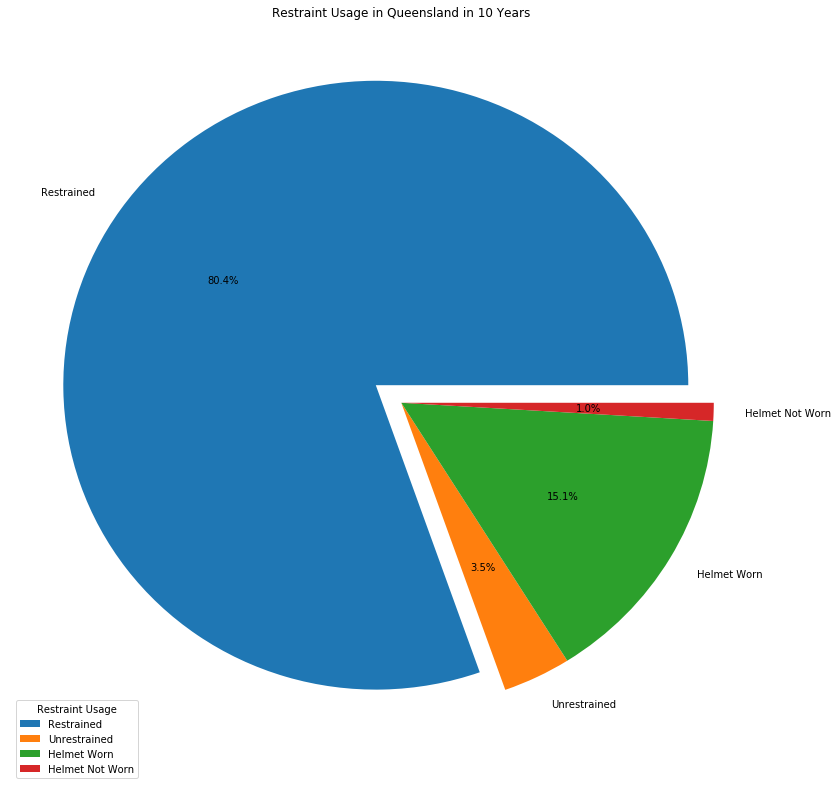

In [70]:
plt.figure(figsize=(14,14))
labels = ['Restrained', 'Unrestrained', 'Helmet Worn', 'Helmet Not Worn']
ax = plt.pie(restraint_use_df.total_deaths, labels=restraint_use_df.restraint_type, autopct='%1.1f%%', explode=(0.1,0,0,0),
             )
plt.legend(ax, title="Restraint Usage", loc="best", labels=labels)
plt.title('Restraint Usage in Queensland in 10 Years')
plt.show()


In [71]:
restraints_copy_gender = restraints.copy()
restraints_copy_gender = restraints_copy_gender[~restraints_copy_gender['Casualty_Gender'].isin(['Unknown'])]
gender_count = gender_count(restraints_copy_gender)

In [72]:
gender_count


{'Female': 137059, 'Male': 152609}

In [73]:
gender_group_df = pd.DataFrame.from_dict(age_group_count, orient="index")
gender_group_df = pd.DataFrame({'gender': [x for x in gender_count.keys()], 
                                'total_deaths': [x for x in gender_count.values()]})
gender_group_df

,gender,total_deaths
0,Female,137059
1,Male,152609


In [74]:
age_group_df = pd.DataFrame.from_dict(age_group_count, orient="index")
age_group_df = pd.DataFrame({'Age Group': [x for x in age_group_count.keys()], 'Casualty Count': [x for x in age_group_count.values()]})

In [75]:
age_group_df

,Age Group,Casualty Count
0,0 to 16,22085
1,17 to 24,72631
2,25 to 29,32385
3,30 to 39,52032
4,40 to 49,43925
5,50 to 59,32071
6,60 to 74,23817
7,75 and over,9299


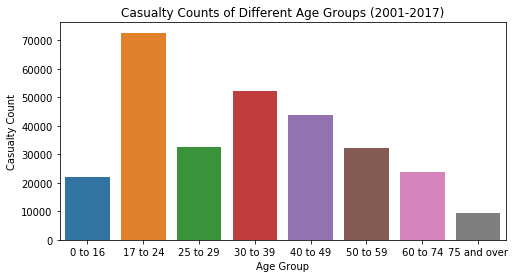

In [76]:
plt.figure(figsize=(8,4))
plt.title("Casualty Counts of Different Age Groups (2001-2017)")
sns.barplot(x="Age Group", y="Casualty Count", data=age_group_df)
plt.show()

<h3>What this data shows us</h3>
<p>As we can see from the pie chart, for majority of casualities the victim was restrained or wore a helmet, this is the expected outcome we predicted. However, the total of unrestrained victims totalled higher than expected, which can be due to other factors such as being on a bus or the age of the person (not having the knowledge to be restrained) </p>

<h3>Difference in casualities based on different types of vehicles (not including cars)</h3>

In [77]:
def truck_count(data):
    vehicleCount = {}
    for i in range(0, data.shape[0]):
        vehicleCount[data.iloc[i]['Involving_Truck']] = 0
    for i in range(0, data.shape[0]):
        vehicleCount[data.iloc[i]['Involving_Truck']] = vehicleCount[data.iloc[i]['Involving_Truck']] + data.iloc[i]['Count_Casualty_All']
    return vehicleCount

def bus_count(data):
    vehicleCount = {}
    for i in range(0, data.shape[0]):
        vehicleCount[data.iloc[i]['Involving_Bus']] = 0
    for i in range(0, data.shape[0]):
        vehicleCount[data.iloc[i]['Involving_Bus']] = vehicleCount[data.iloc[i]['Involving_Bus']] + data.iloc[i]['Count_Casualty_All']
    return vehicleCount

def motorbike_count(data):
    vehicleCount = {}
    for i in range(0, data.shape[0]):
        vehicleCount[data.iloc[i]['Involving_Motorcycle_Moped']] = 0
    for i in range(0, data.shape[0]):
        vehicleCount[data.iloc[i]['Involving_Motorcycle_Moped']] = vehicleCount[data.iloc[i]['Involving_Motorcycle_Moped']] + data.iloc[i]['Count_Casualty_All']
    return vehicleCount

In [78]:
vehicle_truck_count = truck_count(vehicles)
vehicle_truck_count


{'No': 283693, 'Yes': 20774}

In [79]:
df_truck = pd.DataFrame(data=vehicle_truck_count, index=[0])
df_truck

,No,Yes
0,283693,20774


In [80]:
vehicle_bus_count = bus_count(vehicles)
vehicle_bus_count

{'No': 297324, 'Yes': 7143}

In [81]:
df_bus = pd.DataFrame(data=vehicle_bus_count, index=[0])
df_bus

,No,Yes
0,297324,7143


In [82]:
vehicle_motorbike_count = motorbike_count(vehicles)
vehicle_motorbike_count

{'No': 275030, 'Yes': 29437}

In [83]:
df_motorbike = pd.DataFrame(data=vehicle_motorbike_count, index=[0])
df_motorbike

,No,Yes
0,275030,29437


In [84]:
vehicle_df = pd.DataFrame({'Vehicle_Type':['Truck', 'Bus', 'Motorbike'], 'Casaulty_Count': ['20774', '7143', '29437']})
vehicle_df

,Vehicle_Type,Casaulty_Count
0,Truck,20774
1,Bus,7143
2,Motorbike,29437


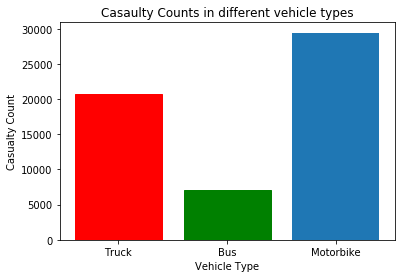

In [85]:
x = ["Truck","Bus","Motorbike"]
y = [20774, 7143, 29437]
ax = plt.bar(x,y)
ax[0].set_color('r')
ax[1].set_color('g')
plt.title("Casaulty Counts in different vehicle types")
plt.xlabel("Vehicle Type")
plt.ylabel("Casualty Count")
plt.show()

<p>We can see that motorbikes hold the most casaulties compared to the others by a large difference. This is the expected outcome based on research of road safety and the typical road behaviours of people who use motorcycles.</p>

<h3>Heatmap of factors in car crashes: examining the crash region, crash year and casualty total</h3>

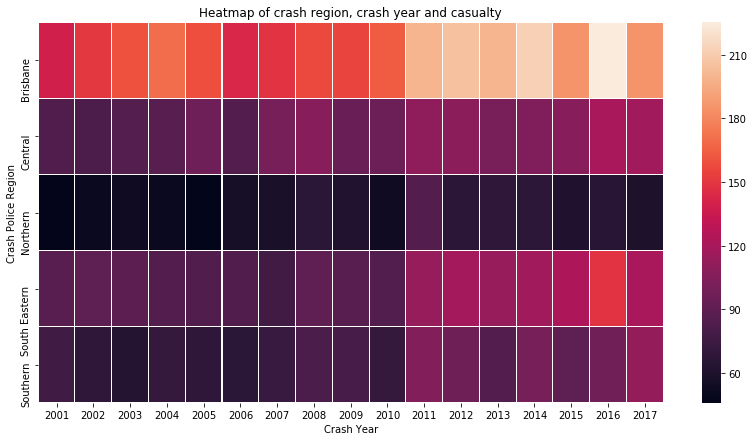

In [132]:
factors_copy = factors.copy()
factors_copy = factors_copy[~factors_copy['Crash_Police_Region'].isin(['Unknown'])]

factors_copy = factors_copy.pivot_table("Count_All_Casualties", "Crash_Police_Region", "Crash_Year")
plt.figure(figsize=(14,7))
ax = sns.heatmap(factors_copy, linewidths=0.05)
plt.xlabel("Crash Year")
plt.ylabel("Crash Police Region")
plt.title("Heatmap of crash region, crash year and casualty")
plt.show()

<p>Here we can conclude that in 2016 within the Brisbane region, the casaulty count was the highest and overall the Northern regions have the least casaulty count.</p> 

<h1>Testing and Training on Vehicles and Restraints</h1>

<h4>Use labelencoder to transform data</h4>

In [87]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
new_restraints = vehicles.apply(le.fit_transform)


<h4>Target Involving_Bus column, predict involvement of buses </h4>

In [88]:
data1 = new_restraints.drop(columns=['Involving_Bus'])
target = new_restraints.Involving_Bus


In [89]:
new_restraints.head()

,Crash_Year,Crash_Police_Region,Crash_Severity,Involving_Motorcycle_Moped,Involving_Truck,Involving_Bus,Count_Crashes,Count_Casualty_Fatality,Count_Casualty_Hospitalised,Count_Casualty_MedicallyTreated,Count_Casualty_MinorInjury,Count_Casualty_All
0,0,0,0,0,0,0,40,40,20,3,0,66
1,0,0,0,0,0,1,0,1,1,0,0,2
2,0,0,0,0,1,0,1,2,0,1,2,5
3,0,0,0,1,0,0,4,5,0,2,0,7
4,0,0,0,1,1,0,0,1,0,0,0,1


<h4>Split the data</h4>

In [90]:
X_train_restraint, X_test_restraint, y_train_restraint, y_test_restraint = train_test_split(data1, target, 
                                                                                            test_size=0.3, random_state=0)

In [91]:
print("X_train shape: {}".format(X_train_restraint.shape))
print("X_test shape: {}".format(X_test_restraint.shape))
print("y_test shape: {}".format(y_test_restraint.shape))
print("y_train shape: {}".format(y_train_restraint.shape))

X_train shape: (1483, 11)
X_test shape: (636, 11)
y_test shape: (636,)
y_train shape: (1483,)


<h3>Implement GaussianNB for comparison <h3>

In [92]:
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB

clf = GaussianNB()
clf.fit(X_train_restraint,y_train_restraint)
print(clf.predict(X_train_restraint))
y_pred = clf.predict(X_test_restraint)

print("Accuracy score is:", np.mean(y_pred == y_test_restraint))


[1 1 1 ... 1 1 0]
Accuracy score is: 0.7547169811320755


<h3>Implement KNN </h3>

In [93]:
from sklearn.neighbors import KNeighborsClassifier
neigh = KNeighborsClassifier(n_neighbors=3)
neigh.fit(X_train_restraint, y_train_restraint) 
#KNeighborsClassifier()
print("Test Accuracy:", neigh.score(X_test_restraint, y_test_restraint)) 
print("Train Accuracy:", neigh.score(X_train_restraint, y_train_restraint))


Test Accuracy: 0.8490566037735849
Train Accuracy: 0.925826028320971


<h4>Find the optimal k value with CV score (number of folds = 10) </h4>

In [94]:
from sklearn.model_selection import cross_val_score
neighbors = list(range(1,10))
cv_scores = []
for k in neighbors:
    neigh = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(neigh, X_train_restraint, y_train_restraint, cv=10, scoring='accuracy')
    #print(scores)
    cv_scores.append(np.mean(scores))
print(cv_scores) #now we need the highest value 
optimal_k = neighbors[cv_scores.index(max(cv_scores))]
print("Optimal value of k is:", optimal_k)


[0.8375051362827011, 0.8288126024942899, 0.8449197999533569, 0.8321363172513699, 0.8361814252274463, 0.8348165313649494, 0.8334241206005348, 0.8280549930837562, 0.8327847845105756]
Optimal value of k is: 3


<h3>Implement MLPClassifier</h3>

<h4>Target Involving_Motorcycle_Moped column, predict involvement of Motorcycles and Mopeds</h4>


In [95]:
data_moped = new_restraints.drop(columns=['Involving_Motorcycle_Moped'])
target_moped = new_restraints.Involving_Motorcycle_Moped


<h4>Split the data, with test_size = 0.3</h4>

In [96]:
X_train_moped, X_test_moped, y_train_moped, y_test_moped = train_test_split(data_moped, target_moped, 
                                                                                            test_size=0.3, random_state=0)

<h4>Use MLP with max_iter=400 and random_state=0</h4>

In [97]:
from sklearn.neural_network import MLPClassifier
clf = MLPClassifier(random_state=0, max_iter=400)
clf.fit(X_train_moped,y_train_moped)
y_pred = clf.predict(X_test_moped)

train_moped = clf.score(X_train_moped,y_train_moped)
test_moped = clf.score(X_test_moped,y_test_moped)
print("Train accuracy:",clf.score(X_train_moped,y_train_moped))
print("Test accuracy:",clf.score(X_test_moped,y_test_moped)) #print(accuracy_score(y_test, y_pred)) is same value


Train accuracy: 0.9763991908293999
Test accuracy: 0.9544025157232704


<h3>Comparing on Motorcycles and Mopeds with GNB </h3>

In [98]:
from sklearn.naive_bayes import GaussianNB
clf_moped = GaussianNB()
clf_moped.fit(X_train_moped, y_train_moped)
GaussianNB(priors=None)
y_pred = clf_moped.predict(X_test_moped)

train_val = clf_moped.score(X_train_moped,y_train_moped)
test_val = clf_moped.score(X_test_moped,y_test_moped)
print("Train accuracy:",clf_moped.score(X_train_moped,y_train_moped))
print("Test accuracy:",clf_moped.score(X_test_moped,y_test_moped))

Train accuracy: 0.5205664194200944
Test accuracy: 0.5440251572327044
